In [1]:
import torch
import numpy as np

from collections.abc import Callable

import matplotlib.pyplot as plt

from src.diffusion_brain.data_utils import get_dataloader
from types import SimpleNamespace

In [2]:
class RecursiveNamespace(SimpleNamespace):

  @staticmethod
  def map_entry(entry):
    if isinstance(entry, dict):
      return RecursiveNamespace(**entry)

    return entry

  def __init__(self, **kwargs):
    super().__init__(**kwargs)
    for key, val in kwargs.items():
      if type(val) == dict:
        setattr(self, key, RecursiveNamespace(**val))
      elif type(val) == list:
        setattr(self, key, list(map(self.map_entry, val)))

toy


/tmp/ipykernel_27953/1150265555.py:19: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs.legend()


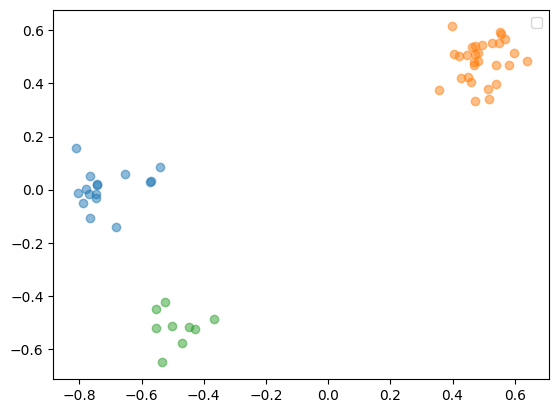

In [11]:
%matplotlib inline
args = {"data" : {"data_name" : "toy"}, "train": {"image_sieze": 1, "batch_size": 128, "dataset_size": 60000, "label_type": "index"}, "validation": {"batch_size": 128, "n_steps": 100, "guidance_scale": 0.8, "label_to_generate": 2}}
args = RecursiveNamespace(**args)
print(args.data.data_name)

train_dl, val_dl = get_dataloader(args)

data, labels = next(iter(train_dl))
data_4 = data[labels==4]
data_8 = data[labels==7]
data_1 = data[labels==1]

# plot both data_4 and data_8 n one scatter plot:
fig, axs = plt.subplots()
for d in [data_1, data_4, data_8]:
  d = d.numpy()
  axs.scatter(d[:,0], d[:,1], alpha=0.5)

axs.legend()
plt.show()

In [2]:
def sample_data(n_samples=1000, label_type='index'):
    z = torch.randn(n_samples, 2)
    scale = 4
    sq2 = 1 / np.sqrt(2)
    centers = [(1, 0), (-1, 0), (0, 1), (0, -1), (sq2, sq2), (-sq2, sq2), (sq2, -sq2), (-sq2, -sq2)]
    centers = torch.tensor([(scale * x, scale * y) for x, y in centers])

    # Randomly assign each sample to a Gaussian blob
    center_indices = torch.randint(len(centers), size=(n_samples,))
    selected_centers = centers[center_indices]
    gaussians = sq2 * (0.5 * z + selected_centers)

    # Generate labels based on the label_type
    if label_type == 'index':
        labels = center_indices  # Numeric labels (0, 1, 2, ...)
    elif label_type == 'coordinates':
        labels = selected_centers  # Center coordinates as labels
    else:
        raise ValueError("Invalid label_type. Choose 'index' or 'coordinates'.")

    # copy the information over height and width channels to be compatible with convnets
    # gaussians = gaussians[:, :, None, None] #.expand(-1, -1, 32, 32)
    gaussians = gaussians[:, :, None]#.expand(-1, -1, 32)

    return gaussians, labels #[:, None]

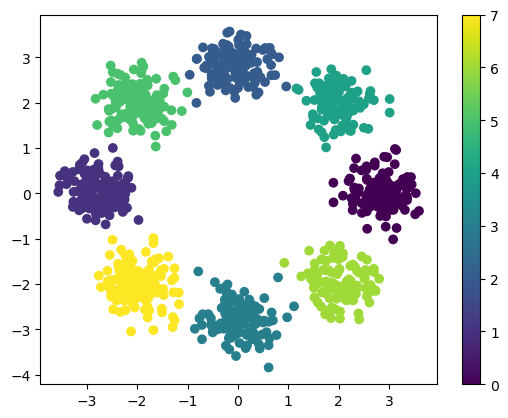

In [3]:
data = sample_data()

plt.scatter(data[0][:,0].cpu().numpy(), data[0][:,1].cpu().numpy(), c=data[1].cpu().numpy(), label=data[1].unique().cpu().numpy())
# label the plot with the blob's labels:
#plt.legend(title="Blob Labels", loc="best")
plt.colorbar()

torch.FloatTensor


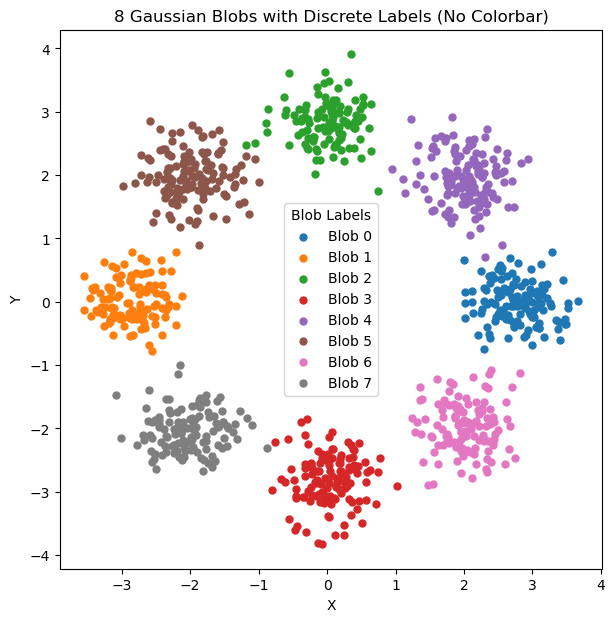

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# X: shape (N,2)
# y: shape (N,) with values 0..7 (8 blobs)
data, labels = sample_data()
X = data.squeeze().cpu().numpy()
y = labels.cpu().numpy()
y = np.asarray(y).astype(int).reshape(-1)

unique_labels = np.unique(y)
cmap = plt.cm.tab10   # discrete color map

plt.figure(figsize=(7, 7))

for lbl in unique_labels:
    idx = np.where(y == lbl)[0]  # indices of cluster lbl
    pts = X[idx]

    plt.scatter(
        pts[:, 0], pts[:, 1],
        s=25,
        color=cmap(lbl),
        label=f"Blob {lbl}"   # <-- your discrete label
    )

plt.legend(title="Blob Labels")
plt.xlabel("X")
plt.ylabel("Y")
plt.title("8 Gaussian Blobs with Discrete Labels (No Colorbar)")
plt.show()


In [11]:
data, labels = sample_data()
X = data.squeeze().cpu().numpy()
y = labels.cpu().numpy()

unique_labels = np.unique(y)

for l in unique_labels:
    print(y == l)


/tmp/ipykernel_2246326/259933287.py:8: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print(y == l)


TypeError: 

In [48]:
data, labels = sample_data(n_samples=1000, label_type='index')

X = data.squeeze().cpu().numpy()
y = labels.cpu().numpy()

idx = np.where(y == 1)[0]      # ← indices where label == lbl
pts = X[idx]

pts.shape

(138, 2)

In [10]:
beta_min = 0.1
beta_max = 20

sigma_min = 0.01
sigma_max = 50

def beta_t(t, beta_min=0.1, beta_max=20):
        return beta_min + t * (beta_max - beta_min)

# def marginal_prob(self, x, t):
#     log_mean_coeff = -0.25 * t ** 2 * (self.beta_1 - self.beta_0) - 0.5 * t * self.beta_0
#     mean = torch.exp(log_mean_coeff[:, None, None, None]) * x
#     std = torch.sqrt(1. - torch.exp(2. * log_mean_coeff))
#     return mean, std

def integral_vp(t, beta_min=0.1, beta_max=20):
        #print("time shape is ", t.shape)
        # return -0.5 * np.cumsum(beta_t(t), axis=0) * (t[1] - t[0])
        return -0.25 * t ** 2 * (beta_max - beta_min) - 0.5 * t * beta_min

def integral_ve(t, sigma_min=0.01, sigma_max=50):
        return sigma_min * (sigma_max / sigma_min)**t #np.log(sigma_min) + t * (np.log(sigma_max) - np.log(sigma_min)) # self.sigma_min * (self.sigma_max / self.sigma_min) ** t

def f_vp(x, t):
        return -0.5 * x * beta_t(beta_min, beta_max, t)  #(beta_max - beta_min) * np.ones_like(t) 

def g_vp(x, t):
        return np.sqrt(beta_t(beta_min, beta_max, t)) #np.sqrt(beta_max - beta_min) * np.ones_like(t)

def f_ve(x, t):
        return 0 * np.ones_like(t)

def g_ve(x, t):
        a = sigma_min * np.sqrt(2 * (np.log(sigma_max) - np.log(sigma_min)))
        r = sigma_max / sigma_min
        return a * (r ** t)


In [11]:
def run_sde(f: Callable,
            g: Callable,
            x_0: np.ndarray,
            t_0: float = 0.0, 
            T: float = 1.0, 
            n_steps: int = 1000,
            **kwargs):
    """Function to run stochastic differential equation. We assume a deterministic initial distribution p_0."""
    
    #Number of trajectories, dimension of data:
    n_traj, dim_x = x_0.shape

    #Compute time grid for discretization and step size:
    time_grid = np.linspace(t_0, T, n_steps)
    dt = time_grid[1] - time_grid[0]
    
    #Compute the random drift at every time point:
    # diffusivity_grid = g(time_grid)
    
    # #Sample random drift at every time point:
    # z = torch.randn(size=(n_steps, n_traj, dim_x))
    # diffusivity_grid_sample = diffusivity_grid[:, None, None] * torch.sqrt(dt) * z
    
    #Initialize list of trajectory:
    x_traj = [x_0]
    injected_noises = []
    for idx, t in enumerate(time_grid):
        #Get last location and time
        x = x_traj[idx]
        t = time_grid[idx]
        
        #Get deterministic drift and random drift sample
        determ_drift = f(x, t) * dt

        z = np.random.randn(n_traj, dim_x)
        injected_noises.append(z[::-1])
        
        diffusivity_sample = g(x, t) * np.sqrt(dt) * z 
        
        #Compute next step:
        next_step = x + determ_drift + diffusivity_sample
        
        #Save step:
        x_traj.append(next_step)

    return np.stack(x_traj), np.stack(injected_noises)       

In [ ]:
# just a checking method to make sure that we have the respective reverse process to the forward process
# for now specifically for VP process as I don't yet define the integral of VE process (it's 0???)
def run_reverse_sde(f: Callable,
            g: Callable,
            reverse_x_0: np.ndarray,
            forward_x_0: np.ndarray,
            t_0: float = 0.0, 
            T: float = 1.0, 
            n_steps: int = 1000,
            injected_noises = None,
            epsilon=1e-5,
            vp_process=True,
            **kwargs
):
    
    time_grid = np.linspace(epsilon, T, n_steps) # was (epsilon, T, ...) don't start with t = 0 to avoid division by zero in score function
    print("time grid: ", time_grid)
    
    reverse_x_0 = reverse_x_0.astype(np.float64)
    forward_x_0 = forward_x_0.astype(np.float64)
    injected_noises = injected_noises.astype(np.float64)
    time_grid = time_grid.astype(np.float64)

    
    time_grid = time_grid[::-1]  # reverse time grid
    dt = time_grid[1] - time_grid[0]
    print(dt)

    integral_vp_vals = integral_vp(time_grid)
    print("integral_vp_vals shape: ", integral_vp_vals.shape)
    #print("integral vals: ", np.min(integral_vp_vals), np.max(integral_vp_vals))

    print("reverse_x_0 shape: ", reverse_x_0.shape)
     #Initialize list of trajectory:
    x_traj = [reverse_x_0]
    for idx, t in enumerate(time_grid):
        #print(t)
        x = x_traj[idx]
        t = time_grid[idx]

        determ_drift = f(x, t) * dt
        #print(np.exp(2 * integral_vp_vals[idx]))
        #print(np.min(x), np.max(x)) becomes at 2nd step -inf inf
        if vp_process:
            #print(forward_x_0 * np.exp(integral_vp_vals[idx]) - x)
            
            score = (forward_x_0 * np.exp(integral_vp_vals[idx]) - x) / (1 - np.exp(2 * integral_vp_vals[idx])) # x_0 was wrong idea
        elif vp_process == False:
            score = (forward_x_0 - x) / integral_ve(t)

        #print("x * np.exp(integral_vp_vals[idx]) - x ", x * np.exp(integral_vp_vals[idx]) - x)
        # bounded: print(1 - np.exp(2 * integral_vp_vals[idx]))
        #print("score ", score)
        z = injected_noises[idx][0] #injected_noises[len(time_grid) - idx - 1][0] # TODO: check for the shape here!!!!!!!!
        diffusivity_sample = g(x, t) * np.sqrt(np.abs(dt)) * z 

        #(1000, 1000) (1000, 1000) () (1000, 1000) (1000, 1)
        # print(f"time {t} Shapes: ", x.shape, determ_drift.shape, g(x, t).shape, score.shape, diffusivity_sample.shape)
        # print("potential unwanted broadcast shape: ", diffusivity_sample)
        # print("x", x)
        # print("\n")
        # print("determ_drift", determ_drift)
        # print("\n")
        # print("g(x, t)**2 * score * dt", g(x, t)**2 * score * dt)
        # print("\n")
        # print("diffusivity_sample", diffusivity_sample)
        next_step = x + determ_drift - g(x, t)**2 * score * dt + diffusivity_sample
        print(f"time {t} next_step: ", next_step.shape) # (1000, 1000)

        # time 1.0 Shapes:  (1000,) (1000,) () (1000,) (1000, 1)
        # time 1.0 next_step shapes:  (1000, 1000)
            
        # print(x.shape)
        # print(determ_drift.shape)
        # print(score.shape)
        # print(diffusivity_sample.shape)
        x_traj.append(next_step)
    
    print(len(x_traj))
    return np.stack(x_traj)

In [17]:
n_steps = 1000
time_grid = np.linspace(0, 1, n_steps + 1)

ouputs_vp, injected_noises_vp = run_sde(f_vp, g_vp, np.zeros((10, 1)), n_steps=n_steps) # draw 1000 processes with n_steps each
ouputs_vp = ouputs_vp.squeeze()

mean_x_traj_vp = ouputs_vp.mean(axis=1)
std_x_traj_vp = ouputs_vp.std(axis=1)

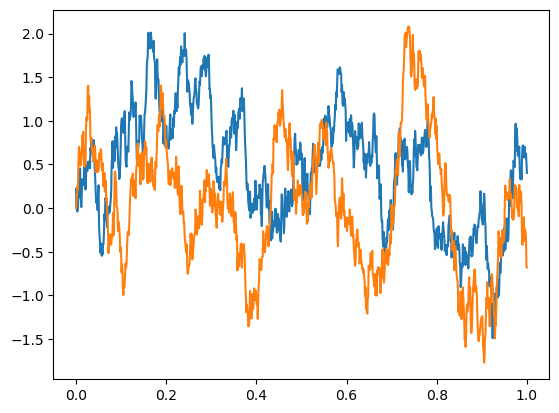

In [18]:
for idx in range(2): # ouputs_vp.shape[1]
    plt.plot(time_grid[:], ouputs_vp[:,idx])

plt.show()    

In [ ]:
n_steps=1000
rev_ouputs_vp = run_reverse_sde(f_vp, g_vp, reverse_x_0 = ouputs_vp[-1], forward_x_0=ouputs_vp[0], n_steps=n_steps, injected_noises=injected_noises_vp, epsilon=1e-1) # draw 1000 processes with n_steps each


time grid:  [1.00000000e-05 1.01099099e-03 2.01198198e-03 3.01297297e-03
 4.01396396e-03 5.01495495e-03 6.01594595e-03 7.01693694e-03
 8.01792793e-03 9.01891892e-03 1.00199099e-02 1.10209009e-02
 1.20218919e-02 1.30228829e-02 1.40238739e-02 1.50248649e-02
 1.60258559e-02 1.70268468e-02 1.80278378e-02 1.90288288e-02
 2.00298198e-02 2.10308108e-02 2.20318018e-02 2.30327928e-02
 2.40337838e-02 2.50347748e-02 2.60357658e-02 2.70367568e-02
 2.80377477e-02 2.90387387e-02 3.00397297e-02 3.10407207e-02
 3.20417117e-02 3.30427027e-02 3.40436937e-02 3.50446847e-02
 3.60456757e-02 3.70466667e-02 3.80476577e-02 3.90486486e-02
 4.00496396e-02 4.10506306e-02 4.20516216e-02 4.30526126e-02
 4.40536036e-02 4.50545946e-02 4.60555856e-02 4.70565766e-02
 4.80575676e-02 4.90585586e-02 5.00595495e-02 5.10605405e-02
 5.20615315e-02 5.30625225e-02 5.40635135e-02 5.50645045e-02
 5.60654955e-02 5.70664865e-02 5.80674775e-02 5.90684685e-02
 6.00694595e-02 6.10704505e-02 6.20714414e-02 6.30724324e-02
 6.40734234e

In [31]:
np.min(ouputs_vp), np.max(ouputs_vp), np.min(rev_ouputs_vp), np.max(rev_ouputs_vp)

(np.float64(-2.9272237852672722),
 np.float64(2.9152276510671027),
 np.float64(-4.295068789850802e+23),
 np.float64(2.3862913239028232e+19))

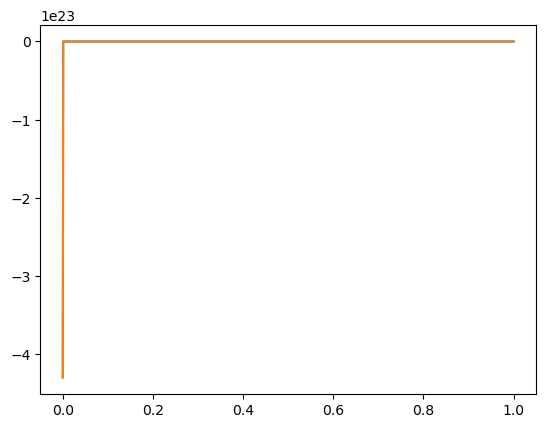

In [32]:
for idx in range(2):
    plt.plot(time_grid[:], rev_ouputs_vp[:,idx][::-1])
    
#plt.gca().invert_xaxis()
plt.show()    

In [5]:
n_steps = 1000
time_grid = np.linspace(0, 1, n_steps + 1)

ouputs_ve, injected_noises_ve = run_sde(f_ve, g_ve, np.zeros((1000, 1)), n_steps=n_steps) 
ouputs_ve = ouputs_ve.squeeze()

mean_x_traj_ve = ouputs_ve.mean(axis=1)
std_x_traj_ve = ouputs_ve.std(axis=1)

In [6]:
n_steps=1000
rev_ouputs_ve = run_reverse_sde(f_ve, g_ve, reverse_x_0=ouputs_ve[-1], forward_x_0=ouputs_ve[0], n_steps=n_steps, injected_noises=injected_noises_ve, epsilon=1e-5, vp_process=False) # draw 1000 processes with n_steps each

time grid:  [1.00000000e-05 1.01099099e-03 2.01198198e-03 3.01297297e-03
 4.01396396e-03 5.01495495e-03 6.01594595e-03 7.01693694e-03
 8.01792793e-03 9.01891892e-03 1.00199099e-02 1.10209009e-02
 1.20218919e-02 1.30228829e-02 1.40238739e-02 1.50248649e-02
 1.60258559e-02 1.70268468e-02 1.80278378e-02 1.90288288e-02
 2.00298198e-02 2.10308108e-02 2.20318018e-02 2.30327928e-02
 2.40337838e-02 2.50347748e-02 2.60357658e-02 2.70367568e-02
 2.80377477e-02 2.90387387e-02 3.00397297e-02 3.10407207e-02
 3.20417117e-02 3.30427027e-02 3.40436937e-02 3.50446847e-02
 3.60456757e-02 3.70466667e-02 3.80476577e-02 3.90486486e-02
 4.00496396e-02 4.10506306e-02 4.20516216e-02 4.30526126e-02
 4.40536036e-02 4.50545946e-02 4.60555856e-02 4.70565766e-02
 4.80575676e-02 4.90585586e-02 5.00595495e-02 5.10605405e-02
 5.20615315e-02 5.30625225e-02 5.40635135e-02 5.50645045e-02
 5.60654955e-02 5.70664865e-02 5.80674775e-02 5.90684685e-02
 6.00694595e-02 6.10704505e-02 6.20714414e-02 6.30724324e-02
 6.40734234e

In [107]:
# for idx in range(1):
#     plt.plot(time_grid[:], ouputs_ve[:,idx])

# plt.show()    

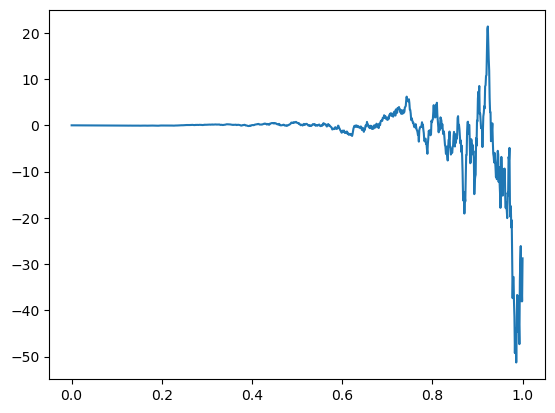

In [7]:
plt.plot(time_grid[:], ouputs_ve[:,1])

plt.show()    

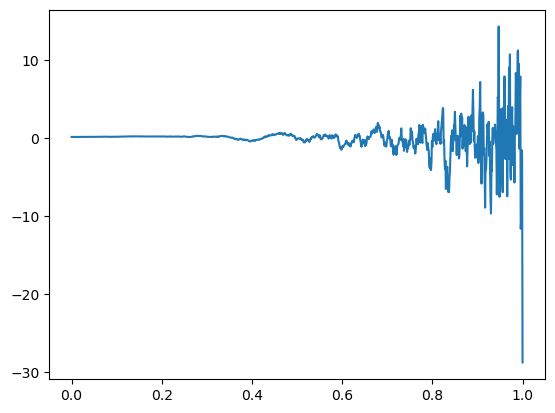

In [8]:
plt.plot(time_grid[:], rev_ouputs_ve[:,1][::-1])
# plt.gca().invert_xaxis()
# plt.show()    

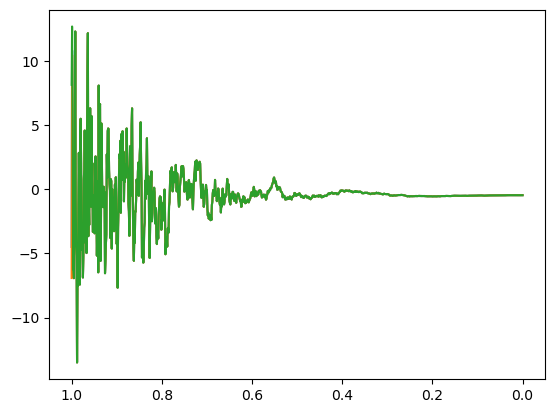

In [133]:
for idx in range(3):
    plt.plot(time_grid[:], rev_ouputs_ve[:,idx][::-1])
    
plt.gca().invert_xaxis()
plt.show()    

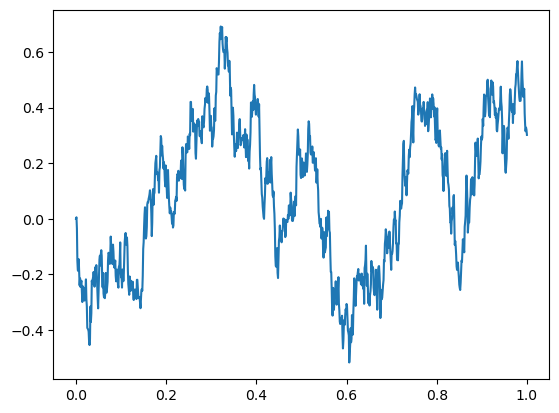

In [134]:
plt.plot(time_grid, mean_x_traj_vp)

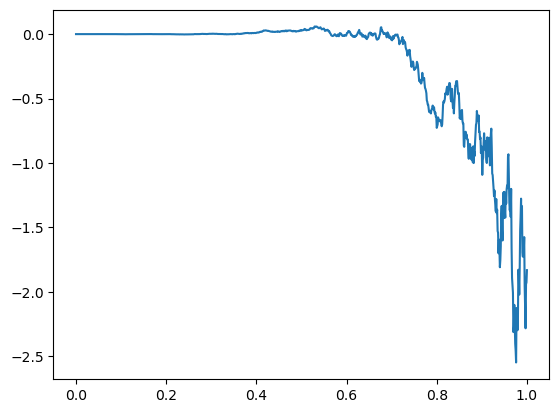

In [135]:
plt.plot(time_grid, mean_x_traj_ve)

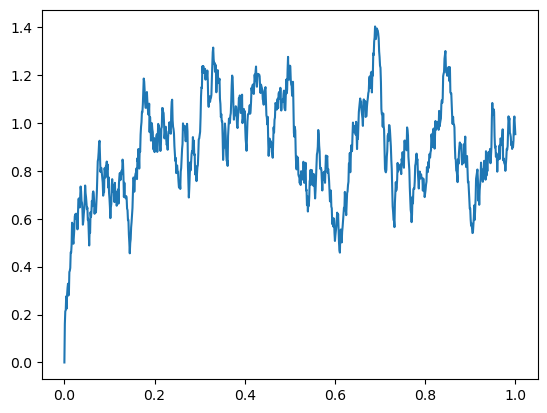

In [136]:
plt.plot(time_grid, std_x_traj_vp)

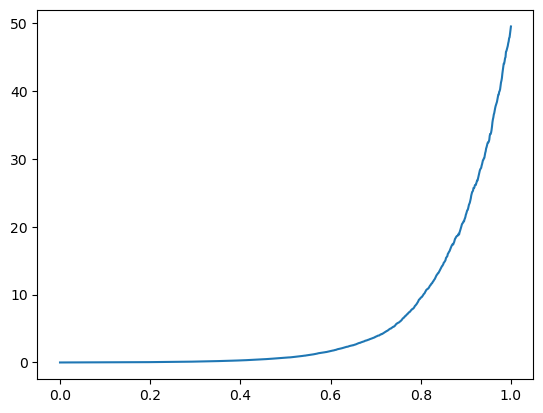

In [137]:
plt.plot(time_grid, std_x_traj_ve)

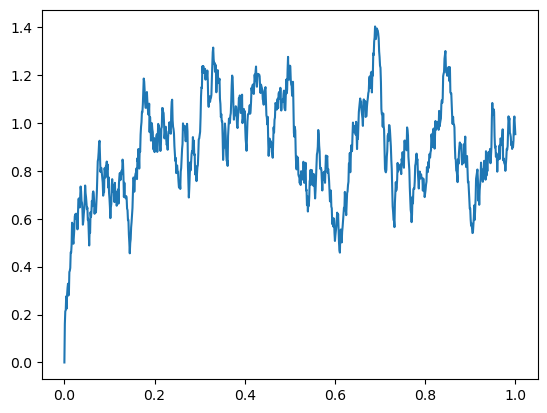

In [138]:
plt.plot(time_grid, std_x_traj_vp)